In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import datetime as dt
import geopandas as gpd
import warnings
import plotly.offline as py

# <h1><center>Data 601 Project: Economic Productivity of Alberta </center></h1>
###  <h1><center>By Team Brown Chang Min (Rudy Brown, Yi-Chi Chang, Aung Khant Min)</center></h1>

# Introduction

The economic health of a province or country has a significant impact on the quality of life and the lifestyle of its constituents. Our goal is to identify trends and distinguishing aspects in Alberta’s economy to evaluate how significant economic indicators for Alberta have changed over time and make note when the trends in these indicators stand out within Canada. We’ve collected and plotted consumer cost and population information for Alberta and compared it with other provincial economies. For Alberta and other provincial economies, we’ve assessed the productivity of the economies on a per person basis and used the data that we’ve gathered to assess the change in inflation-adjusted economic productivity.

The two market indicators we have be utilized in this study is the Gross Domestic Product (GDP) and the Consumer Price Index (CPI). The GDP is the total value (in canadian dollars) of all goods produced and services rendered in a specific area. The CPI is a measure of changes in a consumer's purchasing power and is obtained by comparing the cost of goods and services purchased (as an index) over time and it's a good measure of the intrinsic value of the Canadian dollar. We’ve collected data for GDP and CPI changes for Alberta and other provincial economies in Canada for visualizations about the two economies. The inflation-adjusted GDP has been evaluated by plotting (GDP/CPI) against time and all per capita metrics have been evaluated by plotting  (metric/population) against time.

The guiding questions we will be investigating are: 
1. How has Alberta performed compared to other provinces and Canada as a whole in CPI and GDP?
2. What industrial sectors dominate the Albertan economy?
3. What economic events have impacted the Albertan economy?
4. How has Alberta’s population changed over time compared to other provinces?
5. How has Alberta’s GDP per capita changed over time?
6. How has consumer purchasing power changed over time in Alberta and other selected provinces? (GDP per capita/CPI)



# Datasets

Within this project, CPI and GDP have been used to measure the economic health of the different economies in Canada. For the calculation of GDP per capita, population data of each province was also extracted from the dataset. The structured csv data are publicly available through the website of Statistics Canada (Monthly GDP) and Alberta economic dashboard (Annual GDP, Monthly CPI Quarterly population). 

All of the datasets used in this project are time series format and we will be using date column as a major key for data merging. In the annual GDP data from alberta economic dash board, the GDP data is categorized by province and industry and by how the GDP is calculated (chained 2012 dollars or current dollars). To avoid the effect of inflation and currency fluctuation, we have used chained 2012 dollars for the analysis on GDP. The structure of monthly GDP data from statistic Canada is similar to the annual GDP data but without the province column. The Monthly CPI data from alberta economic dashboard is categorized by commodity(food, good, transportation...etc). The quarterly population data is categorized by province.

The period that will be used in this project is 2000~2022.06. Monthly data is preferred over annual so that we have enough data points for the visualization. However, we are unable to get the province level GDP data, so we will have to use Annual provinces GDP data and monthly Canada GDP data to simulate monthly GDP for each province during the data cleaning process. 

The following are columns used in this analysis:
1. Annual GDP data (statistic Canada) : Date, Province, GDP, Industry
2. Monthly GDP data (statistic Canada) : Date, GDP, Industry
3. Annual GDP data (Alberta economic dashboard): Date, GDP, Industry
4. Monthly CPI (Alberta economic dashboard): Date, Province, CPI
5. Quarterly population (Alberta economic dashboard): Date, Province, Population

## Accessing the Data
All the required Data can be accessed here : https://drive.google.com/drive/folders/1zR7wQ-EnlCTgU1Tln4i0_Ynzl7UNgu5Q

## Data Wrangling

### Reading data

In [2]:
CA_Annual_GDP_path = "Data_601/01-1.Statistic CA_Annual GDP by provinces.xlsx"
Monthly_GDP_path = "Data_601/01-2.Statistic CA_Monthly GDP.xlsx"
AB_Annual_GDP_path = "Data_601/02.AB dashboard_annual GDP.xlsx"
# Unemployment_rate_path = "Data601_Data/03.AB_dashboard_unemployment rate.csv"
Monthly_CPI_path = "Data_601/04.AB dashboard_monthly_CPI.csv"
Quarterly_pop_data = "Data_601/05.AB-dashboard_Quarterly_Population.csv"

In [3]:
CA_Annual_GDP= pd.read_excel(CA_Annual_GDP_path)
CA_Monthly_GDP= pd.read_excel(Monthly_GDP_path)
AB_Annual_GDP = pd.read_excel(AB_Annual_GDP_path)
# Unemployment_rate = pd.read_csv(Unemployment_rate_path)
Monthly_CPI = pd.read_csv(Monthly_CPI_path)
Quarter_pop = pd.read_csv(Quarterly_pop_data)

In [4]:
pd.set_option('display.max_columns', None) #Display all the columns when displaying 
warnings.filterwarnings('ignore') #To hide the warnings so that the code is clean

### Cleaning GDP
#### Step 1 Calculate weight of contribution of each province to Canada's GDP
To simulate monthly GDP data, we will have to first start calculating each province’s weight of contribution to Canada’s GDP, which is simply the ratio of a province’s annual GDP over total GDP of Canada. So first we start filtering out the necessary column we need. We filter out “all industry” and “chained (2012) dollars”. Next, we unstack the data to move province to column index. With this data structure we will be able to easily calculate the weight by simply divides single value over total value.

$$
Weight = \frac{(Annual \ GDP \ of \ province)}{(Annual \ Total \ GDP \ of \ Canada)} \\
Simulated \ Monthly \ Province \ GDP  = (Weight) \times (Monthly \ Total \ GDP \ of \ Canada)
$$





In [5]:
CA_Annual_GDP.head(4)

,REF_DATE,GEO,DGUID,Value,North American Industry Classification System (NAICS),UOM,UOM_ID,SCALAR_FACTOR,SCALAR_ID,VECTOR,COORDINATE,VALUE,STATUS,SYMBOL,TERMINATED,DECIMALS
0,1997,Newfoundland and Labrador,2016A000210,Current dollars,All industries [T001],Dollars,81,millions,6,v62460554,1.1.1,9588.2,NaN,NaN,NaN,1
1,1997,Newfoundland and Labrador,2016A000210,Current dollars,Goods-producing industries [T002],Dollars,81,millions,6,v62460555,1.1.2,2364.1,NaN,NaN,NaN,1
2,1997,Newfoundland and Labrador,2016A000210,Current dollars,Service-producing industries [T003],Dollars,81,millions,6,v62460556,1.1.3,7224.1,NaN,NaN,NaN,1
3,1997,Newfoundland and Labrador,2016A000210,Current dollars,Industrial production [T010],Dollars,81,millions,6,v62460557,1.1.4,1386.9,NaN,NaN,NaN,1


In [6]:
tmp = CA_Annual_GDP[CA_Annual_GDP["North American Industry Classification System (NAICS)"] == "All industries [T001]"] 
tmp = tmp[tmp["Value"] == "Chained (2012) dollars"]
tmp = tmp[["REF_DATE", "GEO", "VALUE"]]
tmp = tmp.set_index(["REF_DATE", "GEO"]).unstack()
tmp["total"] = tmp.sum(axis = 'columns')
Weight = tmp[["VALUE"]].div(tmp.total, axis=0)
Weight = Weight.filter(items = list(range(2000,2022)), axis=0)
Weight.loc[2022] = list(Weight.loc[2021])  #assigned 2021 to 2022 as a substitution of the unknown weight of 2022
display(Weight)


VALUE                                           \
GEO        Alberta British Columbia  Manitoba New Brunswick   
REF_DATE                                                      
2000      0.154115         0.114942  0.031697      0.018586   
2001      0.154477         0.113785  0.031618      0.018579   
2002      0.153289         0.114387  0.031136      0.018848   
2003      0.155784         0.114943  0.030847      0.018885   
2004      0.159449         0.115784  0.030679      0.018791   
2005      0.161698         0.117627  0.030652      0.018394   
2006      0.167619         0.119735  0.030960      0.018219   
2007      0.167497         0.120778  0.031030      0.017968   
2008      0.168275         0.120456  0.031788      0.017974   
2009      0.164468         0.121133  0.032725      0.018294   
2010      0.167407         0.120444  0.032502      0.018086   
2011      0.173074         0.119992  0.032205      0.017555   
2012      0.176716         0.120835  0.032565      0.017031   
2013      0.182256         0.120662  0.032607      0.016550   
2014      0.187555         0.121462  0.032312      0.016101   
2015      0.179577         0.123295  0.032498      0.016103   
2016      0.171377         0.125708  0.032667      0.016095   
2017      0.173275         0.126368  0.032735      0.015977   
2018      0.171861         0.127472  0.032461      0.015741   
2019      0.168749         0.129110  0.032021      0.015662   
2020      0.163893         0.131599  0.032267      0.016016   
2021      0.164322         0.133357  0.031169      0.016088   
2022      0.164322         0.133357  0.031169      0.016088   

                                                                      \
GEO      Newfoundland and Labrador Northwest Territories Nova Scotia   
REF_DATE                                                               
2000                      0.016278              0.002584    0.021934   
2001                      0.016378              0.003076    0.022181   
2002                      0.018399              0.003192    0.022351   
2003                      0.019240              0.003551    0.022197   
2004                      0.018440              0.003522    0.021710   
2005                      0.018332              0.003369    0.021308   
2006                      0.018494              0.003291    0.020836   
2007                      0.020185              0.003508    0.020619   
2008                      0.019655              0.003146    0.020793   
2009                      0.018384              0.002910    0.021478   
2010                      0.018744              0.002895    0.021341   
2011                      0.018692              0.002546    0.020735   
2012                      0.017534              0.002486    0.020166   
2013                      0.017958              0.002491    0.019611   
2014                      0.017268              0.002536    0.019266   
2015                      0.016945              0.002542    0.019259   
2016                      0.017041              0.002490    0.019333   
2017                      0.016733              0.002502    0.019131   
2018                      0.015806              0.002466    0.018924   
2019                      0.016066              0.002277    0.019140   
2020                      0.016062              0.002151    0.019692   
2021                      0.015510              0.002183    0.019879   
2022                      0.015510              0.002183    0.019879   

                                                                          \
GEO        Nunavut   Ontario Prince Edward Island    Quebec Saskatchewan   
REF_DATE                                                                   
2000      0.000950  0.391214             0.003109  0.200284     0.043167   
2001      0.000994  0.392077             0.003023  0.200599     0.042044   
2002      0.000988  0.392567             0.003069  0.199981     0.040672   
2003      0.000969  0.389531             0.00

#### Step 2 Left join "Weight" data to "Canadian monthly GDP" data and multiply the weight and GDP values
Next step, we merge the weight data frame to Canada monthly GDP data using Year as a key. After merging, we will be able to calculate the simulated GDP by simply multiply the weight and monthly total GDP of Canada.

In [7]:
tmp = CA_Monthly_GDP[CA_Monthly_GDP["Prices"] == "Chained (2012) dollars"]
tmp = tmp[tmp["North American Industry Classification System (NAICS)"] == "All industries [T001]"]
tmp = tmp[["REF_DATE", "VALUE"]]
tmp["REF_DATE"] = pd.to_datetime(tmp["REF_DATE"])
tmp["Year"] = pd.DatetimeIndex(tmp['REF_DATE']).year.astype("int")
tmp = tmp[tmp["Year"] >= 2000]
tmp  = pd.merge(tmp, Weight,how='outer', left_on = "Year", right_on = "REF_DATE")
tmp.rename(columns=''.join, inplace=True)
tmp["Alberta"] = tmp[["VALUEAlberta"]].multiply(tmp["VALUE"], axis="index").astype("int")
tmp["British Columbia"] = tmp[["VALUEBritish Columbia"]].multiply(tmp["VALUE"], axis="index").astype("int")
tmp["Manitoba"] = tmp[["VALUEManitoba"]].multiply(tmp["VALUE"], axis="index").astype("int")
tmp["New Brunswick"] = tmp[["VALUENew Brunswick"]].multiply(tmp["VALUE"], axis="index").astype("int")
tmp["Newfoundland and Labrador"] = tmp[["VALUENewfoundland and Labrador"]].multiply(tmp["VALUE"], axis="index").astype("int")
tmp["Northwest Territories"] = tmp[["VALUENorthwest Territories"]].multiply(tmp["VALUE"], axis="index").astype("int")
tmp["Nova Scotia"] = tmp[["VALUENova Scotia"]].multiply(tmp["VALUE"], axis="index").astype("int")
tmp["Nunavut"] = tmp[["VALUENunavut"]].multiply(tmp["VALUE"], axis="index").astype("int")
tmp["Ontario"] = tmp[["VALUEOntario"]].multiply(tmp["VALUE"], axis="index").astype("int")
tmp["Prince Edward Island"] = tmp[["VALUEPrince Edward Island"]].multiply(tmp["VALUE"], axis="index").astype("int")
tmp["Quebec"] = tmp[["VALUEQuebec"]].multiply(tmp["VALUE"], axis="index").astype("int")
tmp["Saskatchewan"] = tmp[["VALUESaskatchewan"]].multiply(tmp["VALUE"], axis="index").astype("int")
tmp["Yukon"] = tmp[["VALUEYukon"]].multiply(tmp["VALUE"], axis="index").astype("int")
Monthly_GDP_Simulated = tmp[["REF_DATE", "VALUE", "Year", "Alberta", "British Columbia", "Manitoba", "New Brunswick", "Newfoundland and Labrador", "Northwest Territories", "Nova Scotia", "Nunavut", "Ontario", "Prince Edward Island", "Quebec", "Saskatchewan", "Yukon"]]
display(Monthly_GDP_Simulated.head(4))


,REF_DATE,VALUE,Year,Alberta,British Columbia,Manitoba,New Brunswick,Newfoundland and Labrador,Northwest Territories,Nova Scotia,Nunavut,Ontario,Prince Edward Island,Quebec,Saskatchewan,Yukon
0,2000-01-01,1325658.0,2000,204304,152373,42019,24638,21578,3425,29076,1258,518616,4121,265508,57224,1510
1,2000-02-01,1325888.0,2000,204339,152400,42026,24643,21582,3426,29082,1259,518706,4122,265554,57234,1510
2,2000-03-01,1336931.0,2000,206041,153669,42376,24848,21762,3454,29324,1269,523026,4156,267766,57711,1523
3,2000-04-01,1335504.0,2000,205821,153505,42331,24821,21739,3450,29292,1268,522468,4151,267480,57649,1521


#### Step 3 Growth rate calculation (GDP)
As GDP growth rate is needed for the analysis, we simply apply percent change function to get the growth rate (As GDP data are all positive, we won’t need to worried about the restriction of percent change function on negative data)

In [8]:
Monthly_GDP_Simulated_gr = Monthly_GDP_Simulated[["REF_DATE", "Year"]]
prov_list = ["Alberta", "British Columbia", "Manitoba", "New Brunswick", "Newfoundland and Labrador", "Northwest Territories", "Nova Scotia", "Nunavut", "Ontario", "Prince Edward Island", "Quebec", "Saskatchewan", "Yukon"]
prov_list_GDP = [x + "_GDP" for x in prov_list]
for i in range(len(prov_list)):
    Monthly_GDP_Simulated_gr[prov_list_GDP[i]] = Monthly_GDP_Simulated[prov_list[i]].pct_change()
display(Monthly_GDP_Simulated_gr)

,REF_DATE,Year,Alberta_GDP,British Columbia_GDP,Manitoba_GDP,New Brunswick_GDP,Newfoundland and Labrador_GDP,Northwest Territories_GDP,Nova Scotia_GDP,Nunavut_GDP,Ontario_GDP,Prince Edward Island_GDP,Quebec_GDP,Saskatchewan_GDP,Yukon_GDP
0,2000-01-01,2000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2000-02-01,2000,0.000171,0.000177,0.000167,0.000203,0.000185,0.000292,0.000206,0.000795,0.000174,0.000243,0.000173,0.000175,0.000000
2,2000-03-01,2000,0.008329,0.008327,0.008328,0.008319,0.008340,0.008173,0.008321,0.007943,0.008328,0.008248,0.008330,0.008334,0.008609
3,2000-04-01,2000,-0.001068,-0.001067,-0.001062,-0.001087,-0.001057,-0.001158,-0.001091,-0.000788,-0.001067,-0.001203,-0.001068,-0.001074,-0.001313
4,2000-05-01,2000,0.005660,0.005661,0.005670,0.005681,0.005658,0.005797,0.005667,0.005521,0.005660,0.005782,0.005660,0.005672,0.005917
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
265,2022-02-01,2022,0.008164,0.008167,0.008163,0.008170,0.008186,0.008182,0.008159,0.008379,0.008164,0.008083,0.008164,0.008164,0.007984
266,2022-03-01,2022,0.007080,0.007079,0.007071,0.007094,0.007073,0.007214,0.007078,0.006877,0.007082,0.007093,0.007082,0.007081,0.007261
267,2022-04-01,2022,0.002060,0.002059,0.002069,0.002034,0.002047,0.002014,0.002064,0.002277,0.002058,0.002144,0.002058,0.002057,0.001966
268,2022-05-01,2022,0.000392,0.000395,0.000391,0.000394,0.000409,0.000447,0.000392,0.000284,0.000393,0.000306,0.000393,0.000386,0.000327


### Cleaning CPI
The CPI data is relatively clean. We will not be using “commodity” columns in this analysis (only to filter out "All items"). We also calculate the growth rate of the CPI with percent change function as well.


#### Step 1 filter

In [9]:
Monthly_CPI.dropna(axis = "rows",inplace = True)
Monthly_CPI['When'] = pd.to_datetime(Monthly_CPI['When'], yearfirst = False)
Monthly_CPI_filtered = Monthly_CPI[Monthly_CPI['Commodity']== "All-items"] #Filtering out All-items
Monthly_CPI_filtered = Monthly_CPI_filtered[(Monthly_CPI_filtered["When"] >= "2000-01-01") & (Monthly_CPI_filtered["When"] < "2022-07-01")]
display(Monthly_CPI_filtered)

,Id,When,Commodity,Alberta,BritishColumbia,Canada,Manitoba,NewBrunswick,NewfoundlandAndLabrador,NovaScotia,Ontario,PrinceEdwardIsland,Quebec,Saskatchewan,ModifiedDate
3368,1205250,2000-01-01,All-items,92.4,94.4,93.5,94.6,93.0,95.2,93.5,93.2,92.7,94.1,92.7,8/16/2022 8:06:09 AM
3376,1205258,2000-02-01,All-items,92.3,94.6,94.1,94.8,93.7,96.0,94.3,93.9,92.8,94.8,93.0,8/16/2022 8:06:09 AM
3384,1205266,2000-03-01,All-items,93.3,95.3,94.8,95.4,94.6,96.4,94.8,94.7,93.7,95.2,93.6,8/16/2022 8:06:09 AM
3392,1205274,2000-04-01,All-items,93.3,95.4,94.5,95.3,94.5,95.8,94.4,94.1,94.1,94.9,93.7,8/16/2022 8:06:09 AM
3400,1205282,2000-05-01,All-items,93.9,95.7,94.9,95.3,94.7,95.7,94.8,94.7,94.7,95.3,94.0,8/16/2022 8:06:09 AM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5488,1207370,2022-02-01,All-items,154.5,140.4,146.8,147.4,147.0,149.3,148.8,148.8,151.2,142.6,149.1,8/16/2022 8:06:09 AM
5496,1207378,2022-03-01,All-items,156.5,143.0,148.9,149.9,149.5,151.9,151.4,150.8,154.7,144.5,151.4,8/16/2022 8:06:09 AM
5504,1207386,2022-04-01,All-items,157.0,144.2,149.8,151.1,150.9,153.0,152.4,151.6,156.0,145.5,152.4,8/16/2022 8:06:09 AM
5512,1207394,2022-05-01,All-items,159.2,146.1,151.9,153.8,153.8,155.8,155.7,153.7,160.2,147.6,153.8,8/16/2022 8:06:09 AM


#### Step 2 Growth rate calculation

In [10]:
prov_list_ns = ["Alberta", "BritishColumbia", "Manitoba", "NewBrunswick", "NewfoundlandAndLabrador", "NovaScotia", "Ontario", "PrinceEdwardIsland", "Quebec", "Saskatchewan"]
prov_list = ["Alberta", "British Columbia", "Manitoba", "New Brunswick", "Newfoundland and Labrador", "Nova Scotia", "Ontario", "Prince Edward Island", "Quebec", "Saskatchewan"]
prov_list_CPI = [x+"_CPI" for x in prov_list]
    
Monthly_CPI_filtered_gr = Monthly_CPI_filtered[["When", "Commodity"]]
for i in range(len(prov_list_ns)):
    Monthly_CPI_filtered_gr[prov_list_CPI[i]] = Monthly_CPI_filtered[prov_list_ns[i]].pct_change()
display(Monthly_CPI_filtered_gr)

,When,Commodity,Alberta_CPI,British Columbia_CPI,Manitoba_CPI,New Brunswick_CPI,Newfoundland and Labrador_CPI,Nova Scotia_CPI,Ontario_CPI,Prince Edward Island_CPI,Quebec_CPI,Saskatchewan_CPI
3368,2000-01-01,All-items,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3376,2000-02-01,All-items,-0.001082,0.002119,0.002114,0.007527,0.008403,0.008556,0.007511,0.001079,0.007439,0.003236
3384,2000-03-01,All-items,0.010834,0.007400,0.006329,0.009605,0.004167,0.005302,0.008520,0.009698,0.004219,0.006452
3392,2000-04-01,All-items,0.000000,0.001049,-0.001048,-0.001057,-0.006224,-0.004219,-0.006336,0.004269,-0.003151,0.001068
3400,2000-05-01,All-items,0.006431,0.003145,0.000000,0.002116,-0.001044,0.004237,0.006376,0.006376,0.004215,0.003202
...,...,...,...,...,...,...,...,...,...,...,...,...
5488,2022-02-01,All-items,0.011126,0.007174,0.008898,0.010309,0.010149,0.010870,0.009498,0.010695,0.010631,0.008796
5496,2022-03-01,All-items,0.012945,0.018519,0.016961,0.017007,0.017415,0.017473,0.013441,0.023148,0.013324,0.015426
5504,2022-04-01,All-items,0.003195,0.008392,0.008005,0.009365,0.007242,0.006605,0.005305,0.008403,0.006920,0.006605
5512,2022-05-01,All-items,0.014013,0.013176,0.017869,0.019218,0.018301,0.021654,0.013852,0.026923,0.014433,0.009186


### Export data 

In [11]:
Monthly_GDP_Simulated.to_csv("Monthly_GDP_Simulated.csv")
Monthly_GDP_Simulated_gr.to_csv("Monthly_GDP_Simulated_gr.csv")
Monthly_CPI_filtered.to_csv("Monthly_CPI_filtered.csv")
Monthly_CPI_filtered_gr.to_csv("Monthly_CPI_filtered_gr.csv")

## Cleaning population to generate GDP per Capita

As population data is quarterly based, we will have to label the data with year and season to be able to use It as a key to right join with the monthly GDP data that we just simulated.We do the same label on the simulated GDP data and use it as a key to left join on the population data with labeled.With GDP data and population data at same data frame, we will be able to generate GDP per capita by dividing province GDP on province population.

In [12]:
Quarter_pop['When'] = pd.to_datetime(Quarter_pop['When'], yearfirst = False)
Quarter_pop_filtered =  Quarter_pop[Quarter_pop["When"] >= "2000-01-01"]
Quarter_pop_filtered["month"] = pd.DatetimeIndex(Quarter_pop_filtered['When']).month

# generate season for joining 
Quarter_pop_filtered = Quarter_pop_filtered.assign(Season = ['Q1' if a == 1 else 'Q2' if a == 4 else 'Q3' if a == 7 else "Q4" for a in Quarter_pop_filtered["month"]])
Quarter_pop_filtered["Year_Season"] = pd.DatetimeIndex(Quarter_pop_filtered['When']).year.astype(str) + Quarter_pop_filtered["Season"]
Quarter_pop_filtered


,Id,When,Alberta,BritishColumbia,Canada,Manitoba,NewBrunswick,NewfoundlandAndLabrador,NovaScotia,Ontario,PrinceEdwardIsland,Quebec,Saskatchewan,ModifiedDate,month,Season,Year_Season
216,17934,2000-01-01,2974517.0,4026664.0,30525872,1144428.0,750786.0,531774.0,934594.0,11576994.0,136442.0,7340269.0,1011141.0,6/22/2022 9:07:53 AM,1,Q1,2000Q1
217,17935,2000-04-01,2988465.0,4033319.0,30594030,1145873.0,750543.0,529574.0,934291.0,11621255.0,136289.0,7347179.0,1009177.0,6/22/2022 9:07:53 AM,4,Q2,2000Q2
218,17936,2000-07-01,3004198.0,4039230.0,30685730,1147313.0,750517.0,527966.0,933821.0,11683290.0,136470.0,7356951.0,1007565.0,6/22/2022 9:07:53 AM,7,Q3,2000Q3
219,17937,2000-10-01,3016947.0,4049297.0,30783969,1148183.0,750252.0,526732.0,934459.0,11748348.0,136400.0,7368772.0,1006027.0,6/22/2022 9:07:53 AM,10,Q4,2000Q4
220,17938,2001-01-01,3027941.0,4055229.0,30824441,1148456.0,749715.0,525299.0,933463.0,11771945.0,136377.0,7373978.0,1003469.0,6/22/2022 9:07:53 AM,1,Q1,2001Q1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
301,18019,2021-04-01,4438772.0,5185990.0,38153211,1383638.0,785819.0,519693.0,985776.0,14795883.0,162596.0,8587179.0,1180314.0,6/22/2022 9:07:53 AM,4,Q2,2021Q2
302,18020,2021-07-01,4442879.0,5214805.0,38246108,1383765.0,789225.0,520553.0,992055.0,14826276.0,164318.0,8604495.0,1179844.0,6/22/2022 9:07:53 AM,7,Q3,2021Q3
303,18021,2021-10-01,4464170.0,5249635.0,38436447,1386333.0,794300.0,521758.0,998832.0,14915270.0,165936.0,8631147.0,1180867.0,6/22/2022 9:07:53 AM,10,Q4,2021Q4
304,18022,2022-01-01,4480486.0,5264485.0,38526760,1390249.0,797102.0,522453.0,1002586.0,14951825.0,166331.0,8639642.0,1183269.0,6/22/2022 9:07:53 AM,1,Q1,2022Q1


### Generate GDP per capita 

In [13]:
# assign season to GDP
Monthly_GDP_Simulated["month"] = pd.DatetimeIndex(Monthly_GDP_Simulated['REF_DATE']).month
Monthly_GDP_Simulated = Monthly_GDP_Simulated.assign(Season = ['Q4' if a in [10,11,12] else 'Q1' if a in [1,2,3] else 'Q2' if a in [4,5,6] else "Q3" for a in Monthly_GDP_Simulated["month"]])
Monthly_GDP_Simulated["Year_Season"] = pd.DatetimeIndex(Monthly_GDP_Simulated['REF_DATE']).year.astype(str) + Monthly_GDP_Simulated["Season"]
Monthly_GDP_Simulated

,REF_DATE,VALUE,Year,Alberta,British Columbia,Manitoba,New Brunswick,Newfoundland and Labrador,Northwest Territories,Nova Scotia,Nunavut,Ontario,Prince Edward Island,Quebec,Saskatchewan,Yukon,month,Season,Year_Season
0,2000-01-01,1325658.0,2000,204304,152373,42019,24638,21578,3425,29076,1258,518616,4121,265508,57224,1510,1,Q1,2000Q1
1,2000-02-01,1325888.0,2000,204339,152400,42026,24643,21582,3426,29082,1259,518706,4122,265554,57234,1510,2,Q1,2000Q1
2,2000-03-01,1336931.0,2000,206041,153669,42376,24848,21762,3454,29324,1269,523026,4156,267766,57711,1523,3,Q1,2000Q1
3,2000-04-01,1335504.0,2000,205821,153505,42331,24821,21739,3450,29292,1268,522468,4151,267480,57649,1521,4,Q2,2000Q2
4,2000-05-01,1343064.0,2000,206986,154374,42571,24962,21862,3470,29458,1275,525425,4175,268994,57976,1530,5,Q2,2000Q2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
265,2022-02-01,2032728.0,2022,334021,271079,63357,32702,31527,4436,40407,3490,771812,6485,390726,79651,3030,2,Q1,2022Q1
266,2022-03-01,2047124.0,2022,336386,272998,63805,32934,31750,4468,40693,3514,777278,6531,393493,80215,3052,3,Q1,2022Q1
267,2022-04-01,2051337.0,2022,337079,273560,63937,33001,31815,4477,40777,3522,778878,6545,394303,80380,3058,4,Q2,2022Q2
268,2022-05-01,2052143.0,2022,337211,273668,63962,33014,31828,4479,40793,3523,779184,6547,394458,80411,3059,5,Q2,2022Q2


In [14]:
Alberta_GDP = Monthly_GDP_Simulated[["REF_DATE", "Year_Season","Alberta", "Ontario",  "British Columbia","Quebec", "Saskatchewan"]]
Alberta_pop = Quarter_pop_filtered[["When", "Alberta", "Ontario", "BritishColumbia", "Quebec", "Saskatchewan", "Year_Season"]]
Alberta_GDP = Alberta_GDP.merge(Alberta_pop, on='Year_Season', how='left')
Alberta_GDP["Alberta_GDP_percap(million)"] =(Alberta_GDP["Alberta_x"])/Alberta_GDP["Alberta_y"]
Alberta_GDP["BC_GDP_percap(million)"] = (Alberta_GDP["British Columbia"])/Alberta_GDP["BritishColumbia"]
Alberta_GDP["Ontario_GDP_percap(million)"] =(Alberta_GDP["Ontario_x"])/Alberta_GDP["Ontario_y"]
Alberta_GDP["Quebec_GDP_percap(million)"] =(Alberta_GDP["Quebec_x"])/Alberta_GDP["Quebec_y"]
Alberta_GDP["Saskatchewan_GDP_percap(million)"] =(Alberta_GDP["Saskatchewan_x"])/Alberta_GDP["Saskatchewan_y"]
Alberta_GDP.rename(columns = {'Alberta_x':'Alberta GDP(Million)', 'Alberta_y':'Alberta Population'}, inplace = True)
Alberta_GDP.rename(columns = {'British Columbia':'BC GDP(Million)', 'BritishColumbia':'BC Population'}, inplace = True)
Alberta_GDP.rename(columns = {'Ontario_x':'Ontario GDP(Million)', 'Ontario_y':'Ontario Population'}, inplace = True)
Alberta_GDP.rename(columns = {'Quebec_x':'Quebec GDP(Million)', 'Quebec_y':'Quebec Population'}, inplace = True)
Alberta_GDP.rename(columns = {'Saskatchewan_x':'Saskatchewan GDP(Million)', 'Saskatchewan_y':'Saskatchewan Population'}, inplace = True)
Alberta_GDP_percap = Alberta_GDP[["REF_DATE", "Year_Season", 
                                  "Alberta GDP(Million)", "Alberta Population", "Alberta_GDP_percap(million)", 
                                  "BC GDP(Million)", "BC Population", "BC_GDP_percap(million)", 
                                  "Ontario GDP(Million)", "Ontario Population", "Ontario_GDP_percap(million)", 
                                  "Quebec GDP(Million)", "Quebec Population", "Quebec_GDP_percap(million)", 
                                  "Saskatchewan GDP(Million)", "Saskatchewan Population", "Saskatchewan_GDP_percap(million)"]]
Alberta_GDP_percap

,REF_DATE,Year_Season,Alberta GDP(Million),Alberta Population,Alberta_GDP_percap(million),BC GDP(Million),BC Population,BC_GDP_percap(million),Ontario GDP(Million),Ontario Population,Ontario_GDP_percap(million),Quebec GDP(Million),Quebec Population,Quebec_GDP_percap(million),Saskatchewan GDP(Million),Saskatchewan Population,Saskatchewan_GDP_percap(million)
0,2000-01-01,2000Q1,204304,2974517.0,0.068685,152373,4026664.0,0.037841,518616,11576994.0,0.044797,265508,7340269.0,0.036171,57224,1011141.0,0.056593
1,2000-02-01,2000Q1,204339,2974517.0,0.068697,152400,4026664.0,0.037848,518706,11576994.0,0.044805,265554,7340269.0,0.036178,57234,1011141.0,0.056603
2,2000-03-01,2000Q1,206041,2974517.0,0.069269,153669,4026664.0,0.038163,523026,11576994.0,0.045178,267766,7340269.0,0.036479,57711,1011141.0,0.057075
3,2000-04-01,2000Q2,205821,2988465.0,0.068872,153505,4033319.0,0.038059,522468,11621255.0,0.044958,267480,7347179.0,0.036406,57649,1009177.0,0.057125
4,2000-05-01,2000Q2,206986,2988465.0,0.069262,154374,4033319.0,0.038275,525425,11621255.0,0.045212,268994,7347179.0,0.036612,57976,1009177.0,0.057449
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
265,2022-02-01,2022Q1,334021,4480486.0,0.074550,271079,5264485.0,0.051492,771812,14951825.0,0.051620,390726,8639642.0,0.045225,79651,1183269.0,0.067314
266,2022-03-01,2022Q1,336386,4480486.0,0.075078,272998,5264485.0,0.051857,777278,14951825.0,0.051985,393493,8639642.0,0.045545,80215,1183269.0,0.067791
267,2022-04-01,2022Q2,337079,4500917.0,0.074891,273560,5286528.0,0.051747,778878,15007816.0,0.051898,394303,8653184.0,0.045567,80380,1186308.0,0.067756
268,2022-05-01,2022Q2,337211,4500917.0,0.074921,273668,5286528.0,0.051767,779184,15007816.0,0.051919,394458,8653184.0,0.045585,80411,1186308.0,0.067783


### Adding CPI and calculate Purchasing power
Last, we join all the cleaned data frame we generate to one data frame for the convenience of analysis.

In [15]:
Alberta_Monthly_CPI = Monthly_CPI_filtered[["When", "Alberta", "BritishColumbia", "Ontario", "Quebec", "Saskatchewan"]]
Alberta_GDP_percap_cpi = Alberta_GDP_percap.merge(Alberta_Monthly_CPI, left_on='REF_DATE', right_on = 'When', how='left')
Alberta_GDP_percap_cpi.rename(columns = {'Alberta':'Alberta CPI %'}, inplace = True)
Alberta_GDP_percap_cpi.rename(columns = {'BritishColumbia':'BC CPI %'}, inplace = True)
Alberta_GDP_percap_cpi.rename(columns = {'Ontario':'Ontario CPI %'}, inplace = True)
Alberta_GDP_percap_cpi.rename(columns = {'Quebec':'Quebec CPI %'}, inplace = True)
Alberta_GDP_percap_cpi.rename(columns = {'Saskatchewan':'Saskatchewan CPI %'}, inplace = True)

Alberta_GDP_percap_cpi["Alberta CPI/100"] = Alberta_GDP_percap_cpi["Alberta CPI %"]/100
Alberta_GDP_percap_cpi["AB Purchasing power"] = Alberta_GDP_percap_cpi["Alberta_GDP_percap(million)"]/Alberta_GDP_percap_cpi["Alberta CPI/100"]

Alberta_GDP_percap_cpi["BC CPI/100"] = Alberta_GDP_percap_cpi["BC CPI %"]/100
Alberta_GDP_percap_cpi["BC Purchasing power"] = Alberta_GDP_percap_cpi["BC_GDP_percap(million)"]/Alberta_GDP_percap_cpi["BC CPI/100"]

Alberta_GDP_percap_cpi["Ontario CPI/100"] = Alberta_GDP_percap_cpi["Ontario CPI %"]/100
Alberta_GDP_percap_cpi["ON Purchasing power"] = Alberta_GDP_percap_cpi["Ontario_GDP_percap(million)"]/Alberta_GDP_percap_cpi["Ontario CPI/100"]

Alberta_GDP_percap_cpi["Quebec CPI/100"] = Alberta_GDP_percap_cpi["Quebec CPI %"]/100
Alberta_GDP_percap_cpi["QB Purchasing power"] = Alberta_GDP_percap_cpi["Quebec_GDP_percap(million)"]/Alberta_GDP_percap_cpi["Quebec CPI/100"]

Alberta_GDP_percap_cpi["Saskatchewan CPI/100"] = Alberta_GDP_percap_cpi["Saskatchewan CPI %"]/100
Alberta_GDP_percap_cpi["SK Purchasing power"] = Alberta_GDP_percap_cpi["Saskatchewan_GDP_percap(million)"]/Alberta_GDP_percap_cpi["Saskatchewan CPI/100"]


Alberta_GDP_percap_cpi.to_csv("Q4,Q5,Q7.Alberta_GDP_percap_cpi_pp.csv")
display(Alberta_GDP_percap_cpi)

,REF_DATE,Year_Season,Alberta GDP(Million),Alberta Population,Alberta_GDP_percap(million),BC GDP(Million),BC Population,BC_GDP_percap(million),Ontario GDP(Million),Ontario Population,Ontario_GDP_percap(million),Quebec GDP(Million),Quebec Population,Quebec_GDP_percap(million),Saskatchewan GDP(Million),Saskatchewan Population,Saskatchewan_GDP_percap(million),When,Alberta CPI %,BC CPI %,Ontario CPI %,Quebec CPI %,Saskatchewan CPI %,Alberta CPI/100,AB Purchasing power,BC CPI/100,BC Purchasing power,Ontario CPI/100,ON Purchasing power,Quebec CPI/100,QB Purchasing power,Saskatchewan CPI/100,SK Purchasing power
0,2000-01-01,2000Q1,204304,2974517.0,0.068685,152373,4026664.0,0.037841,518616,11576994.0,0.044797,265508,7340269.0,0.036171,57224,1011141.0,0.056593,2000-01-01,92.4,94.4,93.2,94.1,92.7,0.924,0.074334,0.944,0.040086,0.932,0.048066,0.941,0.038439,0.927,0.061050
1,2000-02-01,2000Q1,204339,2974517.0,0.068697,152400,4026664.0,0.037848,518706,11576994.0,0.044805,265554,7340269.0,0.036178,57234,1011141.0,0.056603,2000-02-01,92.3,94.6,93.9,94.8,93.0,0.923,0.074427,0.946,0.040008,0.939,0.047716,0.948,0.038162,0.930,0.060864
2,2000-03-01,2000Q1,206041,2974517.0,0.069269,153669,4026664.0,0.038163,523026,11576994.0,0.045178,267766,7340269.0,0.036479,57711,1011141.0,0.057075,2000-03-01,93.3,95.3,94.7,95.2,93.6,0.933,0.074243,0.953,0.040045,0.947,0.047706,0.952,0.038318,0.936,0.060978
3,2000-04-01,2000Q2,205821,2988465.0,0.068872,153505,4033319.0,0.038059,522468,11621255.0,0.044958,267480,7347179.0,0.036406,57649,1009177.0,0.057125,2000-04-01,93.3,95.4,94.1,94.9,93.7,0.933,0.073818,0.954,0.039894,0.941,0.047777,0.949,0.038362,0.937,0.060966
4,2000-05-01,2000Q2,206986,2988465.0,0.069262,154374,4033319.0,0.038275,525425,11621255.0,0.045212,268994,7347179.0,0.036612,57976,1009177.0,0.057449,2000-05-01,93.9,95.7,94.7,95.3,94.0,0.939,0.073761,0.957,0.039994,0.947,0.047743,0.953,0.038417,0.940,0.061116
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
265,2022-02-01,2022Q1,334021,4480486.0,0.074550,271079,5264485.0,0.051492,771812,14951825.0,0.051620,390726,8639642.0,0.045225,79651,1183269.0,0.067314,2022-02-01,154.5,140.4,148.8,142.6,149.1,1.545,0.048253,1.404,0.036675,1.488,0.034691,1.426,0.031714,1.491,0.045147
266,2022-03-01,2022Q1,336386,4480486.0,0.075078,272998,5264485.0,0.051857,777278,14951825.0,0.051985,393493,8639642.0,0.045545,80215,1183269.0,0.067791,2022-03-01,156.5,143.0,150.8,144.5,151.4,1.565,0.047973,1.430,0.036263,1.508,0.034473,1.445,0.031519,1.514,0.044776
267,2022-04-01,2022Q2,337079,4500917.0,0.074891,273560,5286528.0,0.051747,778878,15007816.0,0.051898,394303,8653184.0,0.045567,80380,1186308.0,0.067756,2022-04-01,157.0,144.2,151.6,145.5,152.4,1.570,0.047701,1.442,0.035885,1.516,0.034234,1.455,0.031318,1.524,0.044460
268,2022-05-01,2022Q2,337211,4500917.0,0.074921,273668,5286528.0,0.051767,779184,15007816.0,0.051919,394458,8653184.0,0.045585,80411,1186308.0,0.067783,2022-05-01,159.2,146.1,153.7,147.6,153.8,1.592,0.047061,1.461,0.035433,1.537,0.033779,1.476,0.030884,1.538,0.044072


In [16]:
df = Alberta_GDP_percap_cpi.copy()
df = df.groupby('Year_Season').mean()
df

,Alberta GDP(Million),Alberta Population,Alberta_GDP_percap(million),BC GDP(Million),BC Population,BC_GDP_percap(million),Ontario GDP(Million),Ontario Population,Ontario_GDP_percap(million),Quebec GDP(Million),Quebec Population,Quebec_GDP_percap(million),Saskatchewan GDP(Million),Saskatchewan Population,Saskatchewan_GDP_percap(million),Alberta CPI %,BC CPI %,Ontario CPI %,Quebec CPI %,Saskatchewan CPI %,Alberta CPI/100,AB Purchasing power,BC CPI/100,BC Purchasing power,Ontario CPI/100,ON Purchasing power,Quebec CPI/100,QB Purchasing power,Saskatchewan CPI/100,SK Purchasing power
Year_Season,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000Q1,204894.666667,2974517.0,0.068883,152814.000000,4026664.0,0.037951,520116.000000,11576994.0,0.044927,266276.000000,7340269.0,0.036276,57389.666667,1011141.0,0.056757,92.666667,94.766667,93.933333,94.700000,93.100000,0.926667,0.074335,0.947667,0.040046,0.939333,0.047829,0.947000,0.038307,0.931000,0.060964
2000Q2,206854.666667,2988465.0,0.069218,154276.000000,4033319.0,0.038250,525091.666667,11621255.0,0.045184,268823.333333,7347179.0,0.036589,57939.000000,1009177.0,0.057412,93.833333,95.700000,94.700000,95.466667,93.966667,0.938333,0.073767,0.957000,0.039969,0.947000,0.047713,0.954667,0.038327,0.939667,0.061098
2000Q3,208858.000000,3004198.0,0.069522,155770.333333,4039230.0,0.038564,530176.333333,11683290.0,0.045379,271426.666667,7356951.0,0.036894,58500.000000,1007565.0,0.058061,95.466667,96.900000,95.500000,96.200000,94.800000,0.954667,0.072824,0.969000,0.039798,0.955000,0.047517,0.962000,0.038351,0.948000,0.061245
2000Q4,210034.333333,3016947.0,0.069618,156647.000000,4049297.0,0.038685,533162.000000,11748348.0,0.045382,272955.000000,7368772.0,0.037042,58829.666667,1006027.0,0.058477,96.200000,97.100000,96.333333,96.666667,95.566667,0.962000,0.072368,0.971000,0.039840,0.963333,0.047110,0.966667,0.038319,0.955667,0.061191
2001Q1,210934.666667,3027941.0,0.069663,155371.000000,4055229.0,0.038314,535372.333333,11771945.0,0.045479,273914.333333,7373978.0,0.037146,57410.000000,1003469.0,0.057212,94.900000,96.266667,97.100000,97.200000,95.933333,0.949000,0.073416,0.962667,0.039802,0.971000,0.046838,0.972000,0.038217,0.959333,0.059637
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021Q2,321120.000000,4438772.0,0.072344,260609.000000,5185990.0,0.050253,742002.666667,14795883.0,0.050149,375635.000000,8587179.0,0.043744,76574.333333,1180314.0,0.064876,148.400000,135.366667,142.500000,137.066667,143.800000,1.484000,0.048750,1.353667,0.037123,1.425000,0.035193,1.370667,0.031915,1.438000,0.045116
2021Q3,325534.666667,4442879.0,0.073271,264191.333333,5214805.0,0.050662,752203.333333,14826276.0,0.050734,380799.000000,8604495.0,0.044256,77627.000000,1179844.0,0.065794,150.700000,136.966667,144.066667,138.800000,145.000000,1.507000,0.048620,1.369667,0.036988,1.440667,0.035216,1.388000,0.031885,1.450000,0.045375
2021Q4,330872.000000,4464170.0,0.074117,268523.000000,5249635.0,0.051151,764535.666667,14915270.0,0.051259,387042.000000,8631147.0,0.044842,78899.666667,1180867.0,0.066815,151.600000,138.000000,145.900000,140.300000,146.266667,1.516000,0.048890,1.380000,0.037066,1.459000,0.035133,1.403000,0.031962,1.462667,0.045681


## Visualizations 

#### Our filtering and line-graph plotting functions

The code chunk below consists of four functions: filtering, dffiltering, autolineplotter and dfautolineplotter. 

The first function is called filtering and it accepts a substring named "sub" and data to filter from. The substring is set to "GDP(Million)" if no substring is passed and data is set to our aggregate data Alberta_GDP_percap_cpi if no data is passed in. The @return parameter is a filtered version of the data with the date ('When') column as index and the case specific data columns that matches the substring passed in. 

The second function is called dffiltering and it does the same thing as filtering but it does the filtering based on quarters instead of each date. (@param) The substring is set to "GDP(Million)" if no substring is passed and data is set to our aggregate data with year and quarters for date 'df' if no data is passed in. The @return parameter is a filtered version of the data with the date ('Year_Season') column as index and the case specific data columns that matches the substring passed in.

The third function is called Autolineplotter and it takes in the case specific dataset and plots a line graph using pixel express. The paramters that needs to be passed in are the case specific dataset (output from filtering), the title of the graph and the value of the y_label. There is no @return parameter because this function just plots.


In [17]:
#Auto-mating the filtering from the accumulated data set and plotting using plotly

def filtering(sub = "GDP(Million)", data = Alberta_GDP_percap_cpi):
    copied = data.copy()
    copied.set_index('REF_DATE',inplace = True)
    cols = list(copied.columns)
    cols = [x for x in cols if sub in x]
    case_spec = pd.DataFrame()
    cols
    for i in cols: 
        case_spec[i] = copied[i]
    case_spec.reset_index(inplace =True)
    return case_spec

def dffiltering(sub = "GDP(Million)", data = df):
    copied = data.copy()
    cols = list(copied.columns)
    cols = [x for x in cols if sub in x]
    case_spec = pd.DataFrame()
    cols
    for i in cols: 
        case_spec[i] = copied[i]
    case_spec.reset_index(inplace =True)
    return case_spec

def autolineplotter(case_spec,strx,ylabel= "value"):
    fig = px.line(case_spec, x="REF_DATE", y=case_spec.columns,
              hover_data={"REF_DATE": "|%Y %d, %B"},
                  labels={
                     "REF_DATE": "Date",
                     "value": ylabel,
                     "variable": "Provinces"},
              title=strx)
    
    fig.show()
    
def dfautolineplotter(case_spec,strx,ylabel= "value"):
    fig = px.line(case_spec, x="Year_Season", y=case_spec.columns,
              hover_data={"Year_Season": "|%Y"},
                  labels={
                     "Year_Season": "Date",
                     "value": ylabel,
                     "variable": "Provinces"},
              title=strx)
    
    fig.update_layout(
    xaxis = dict(
        tickmode = 'linear',
        tick0 = 4,
        dtick = 4
    ))

    fig.show()

# Guiding Questions:

## Question 1: How has Alberta performed compared to other provinces and Canada as a whole in CPI and GDP?

For GDP: 
- Plotly lineplot of Provincial GDPs timeseries
- Seaborn lineplot of Provincial GDP growth rates 
- Violin plot of Provincial GDP distributions
- Choropleth of 2021 Provincial GDP

For CPI: 
- Plotly lineplot of Provincial CPI timeseries
- Seaborn lineplot of Provincial CPI growth rates 
- Choropleth of 2021 Provincial CPI

### Plotly lineplot of Provincial GDPs timeseries
Ontario has the largest GDP and Alberta is the third largest GDP. 

In [18]:
autolineplotter(filtering(sub="GDP(Million)"),"GDP plot vs Time","GDP(Million)")

### Seaborn lineplot of Provincial GDP growth rates 
Alberta has the largest distribution in GDP growth compared to Ontario and British Columbia. 

Text(0, 0.5, 'GDP_growth rate')

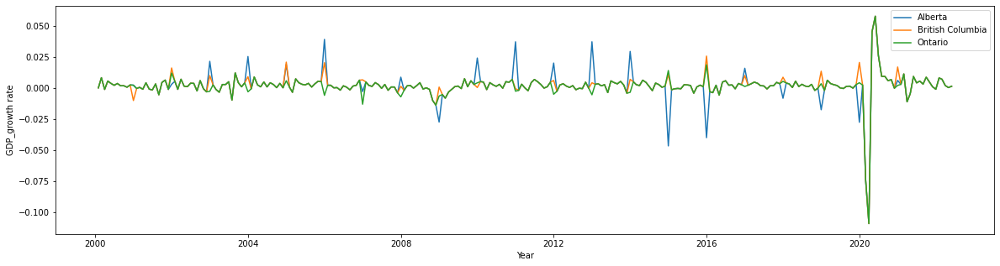

In [19]:
#Plotting GDP 
plt.figure(figsize = (20,5))
sns.lineplot(data=Monthly_GDP_Simulated_gr, x="REF_DATE", y="Alberta_GDP", label = "Alberta")
sns.lineplot(data=Monthly_GDP_Simulated_gr, x="REF_DATE", y="British Columbia_GDP", label = "British Columbia")
sns.lineplot(data=Monthly_GDP_Simulated_gr, x="REF_DATE", y="Ontario_GDP", label = "Ontario")
plt.legend()
plt.xlabel("Year")
plt.ylabel("GDP_growth rate")

### Violin plot of provincial GDP distributions

Violin plot to display distributions of provincial GDPs

In [20]:
#Data cleaning for Violin plot
anngrowfile = 'Data_601/generated_province_annual_gdp_gr.csv'
anngrow = pd.read_csv(anngrowfile)
anngrow.columns = anngrow.loc[0]
anngrow = anngrow[3:]
anngrow = anngrow[['GEO','Alberta','Ontario','Saskatchewan','Quebec','British Columbia']]
anngrow = anngrow.astype('float64')
avganngrow = anngrow[anngrow.columns[1:]].mean()
anngrow.head(5)

,GEO,Alberta,Ontario,Saskatchewan,Quebec,British Columbia
3,1998.0,193229.9,463523.7,56802.9,243815.1,143234.1
4,1999.0,195998.8,495859.1,56889.8,258550.4,147986.4
5,2000.0,207779.6,527438.0,58198.3,270025.0,154965.9
6,2001.0,211558.0,536953.5,57580.0,274723.3,155830.5
7,2002.0,216775.7,555154.7,57517.3,282805.5,161762.2


In [21]:
provs = ['Alberta','Ontario','Saskatchewan','Quebec','British Columbia']

data = [ 
    {"type" :'violin', 'y': anngrow[prov], 'box' : {'visible' : True}, 'meanline': {'visible' : True}, 'name' : prov} for prov in provs
]

py.iplot(data)

### Choropleth of 2021 Provincial GDP

In 2021, the largest economies in Canada were Ontario, Quebec and Alberta in that order. The color of the province on the geo plot is changed based on the province's GDP. 

In [22]:
#cleaning the data for plotting
tmp = CA_Annual_GDP[CA_Annual_GDP["North American Industry Classification System (NAICS)"] == "All industries [T001]"] 
tmp = tmp[tmp["Value"] == "Chained (2012) dollars"]

tmp = tmp[tmp["REF_DATE"] == 2021]
tmp = tmp.groupby("GEO").mean()
tmp = tmp.reset_index()
x = pd.DataFrame()
x[['prov_name_en', 'gdp_value']] = tmp[['GEO','VALUE']]

#Plotting Geopandas
canadafile = "Data_601/georef-canada-province.geojson"
canada_gj = gpd.read_file(canadafile)
canada_gj = canada_gj.to_crs(epsg=4326)
gj = canada_gj.copy()

gj = gj.merge(x, how = 'inner', on = 'prov_name_en')


fig = px.choropleth_mapbox(gj, geojson=gj,
                           locations=gj.index, 
                           color=gj.gdp_value,
                           color_continuous_scale = 'YlGn',
                           center={"lat": 51.0486, "lon": -114.0708}, # Calgary
                           mapbox_style="carto-positron",
                           opacity=0.75,
                           zoom=9, 
                           title = 'Canada\'s GDP values across Provinces during 2021')
fig.update_layout(margin={"r":50,"t":50,"l":50,"b":50}, 
                  autosize=True,
                  height=600 )
fig.show()


### Plotly lineplot of Provincial CPI timeseries

The line plot shows that Alberta has the highest CPI with Saskatchewan and Ontario as second and third. 

In [23]:
autolineplotter(filtering("CPI %"),"CPI Plot","CPI_Values")

### Seaborn lineplot of Provincial CPI growth rates 

This plot shows the growth rates of the three provinces in terms of CPI. Alberta has the highest variance. 

Text(0, 0.5, 'CPI_growth rate')

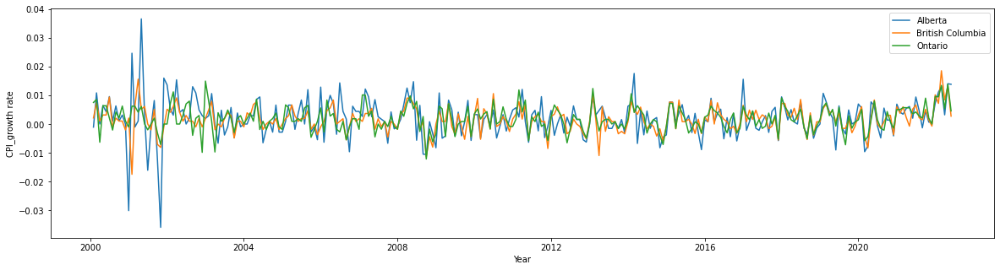

In [24]:
#Plotting CPI 
plt.figure(figsize = (20,5))
sns.lineplot(data=Monthly_CPI_filtered_gr, x="When", y="Alberta_CPI", label = "Alberta")
sns.lineplot(data=Monthly_CPI_filtered_gr, x="When", y="British Columbia_CPI", label = "British Columbia")
sns.lineplot(data=Monthly_CPI_filtered_gr, x="When", y="Ontario_CPI", label = "Ontario")
plt.legend()
plt.xlabel("Year")
plt.ylabel("CPI_growth rate")

### Choropleth of 2021 Provincial CPI

In 2021, the largest CPI index in Canada were Alberta, Saskatchewan and Ontario in that order. The color of the province on the geo plot is changed based on the province's CPI index. 

In [25]:
#Data cleaning for plotting CPI 
cpi = Monthly_CPI.copy()
cpi.When = cpi.When.dt.year
cpi = cpi[cpi["When"] == 2021]
cpi = cpi[cpi.Commodity == "All-items"]
cpi = cpi.drop(["ModifiedDate","Id","Commodity"],axis = 1)
cpi = cpi.set_index('When').stack().reset_index()
cpi = cpi.rename({"level_1":"GEO", 0:"CPI_value"},axis = 'columns')
cpi = cpi.groupby("GEO").mean()
cpi = cpi.reset_index()
x = pd.DataFrame()
x[['prov_name_en', 'CPI_value']] = cpi[['GEO','CPI_value']]
x = x.drop(2)
x.loc[1,'prov_name_en'] = "British Columbia"
x.loc[4,'prov_name_en'] = "New Brunswick"
x.loc[5,'prov_name_en'] = "Newfoundland and Labrador"
x.loc[6,'prov_name_en'] = "Nova Scotia"
x.loc[8,'prov_name_en'] = "Prince Edward Island"


In [26]:
#Plotting the CPI
canada_gj = canada_gj.to_crs(epsg=4326)

gj = canada_gj.copy()

gj = gj.merge(x, how = 'inner', on = 'prov_name_en')

fig = px.choropleth_mapbox(gj, geojson=gj,
                           locations=gj.index, 
                           color=gj.CPI_value,
                           color_continuous_scale = 'magenta',
                           center={"lat": 51.0486, "lon": -114.0708}, # Calgary
                           mapbox_style="carto-positron",
                           opacity=0.75,
                           zoom=9, 
                           title = 'Canada\'s CPI Values across Provinces (2021)')
fig.update_layout(margin={"r":50,"t":50,"l":50,"b":50}, 
                  autosize=True,
                  height=600 )
fig.show()

## Question 2: Which provinces dominate the Canadian Economy and what industrial sectors dominate the Albertan economy?

- Sunburst plot of Sector breakdown of provincial economies
- Sunburst plot of Alberta's industrial breakdown
- Treemap of Sector breakdown of provincial economies

In [27]:
#Getting the data into the layout for sunburst
copy = AB_Annual_GDP.copy()
copy = copy[copy['Type'] == "Gross domestic product at basic prices"]
copy['When'] = pd.to_datetime(copy['When'], yearfirst= True)
copy = copy.drop('ID',axis =1) #Dropping the 'ID' column to set another variable as index
copy = copy.drop('Type',axis =1) #Dropping the 'Type' column as we already sorted out what we need
copy = copy.drop('Canada',axis =1)#Dropping the 'Canada' column as it is accumulated data
copy = copy.drop('Quebec',axis =1)#Dropping the 'Quebec' column as it consists mainly of NaNs
copy = copy[copy.Industries != 'All industries'] #Take out all the 'All industries' rows
copy = copy[copy.Industries != 'Total gross domestic product'] 
copy['When'] = copy.When.dt.year #Change 'When' to year only
copy = copy[copy.When == 2021] # Getting the 2021 data
copy = copy.drop('When',axis= 1)
copy = copy.set_index('Industries')

x = copy.stack().reset_index()
x = x.rename({'level_1': 'Province', 0 : 'GDP'}, axis='columns')
fig = px.sunburst(x, path=['Province','Industries'], values='GDP')
fig.update_layout(
    autosize=False,
    title='Sunburst chart showing Calgary\'s GDP industry contributions for each province (2021)',
    width=800,
    height=800,
)
fig.show()

In [28]:
p = x.copy()
p = p[p['Province']=='Alberta']
fig = px.sunburst(p, path=['Province','Industries'], values='GDP')
fig.update_layout(
    autosize=False,
    title='Sunburst chart showing Calgary\'s GDP industry contributions for each province (2021)',
    width=800,
    height=800,
)
fig.show()

In [29]:
fig = px.treemap(x, path=['Province','Industries'], values='GDP')
fig.update_layout(
    autosize=False,
    title='Treemap showing Canada\'s GDP industry contributions for each province at year 2021',
    width=800,
    height=800,
)
fig.show()

## Q3 What economic events have impacted the Albertan economy?

- Alberta Stacked Bargaph of GDP across time 
- Alberta Percentage of Industry contributions across year 
- Interactive Barplot showing Alberta's industry contribution to GDP 


### Alberta Stacked Bargaph of GDP across time 

Below is a bar graph of Alberta's GDP across time. Across each year, the height indicates the value of GDP and the stacked colors indicate the amount that comes from each industry. We can roughly see that Mining and Real Estate makes up a good percent of GDP. 

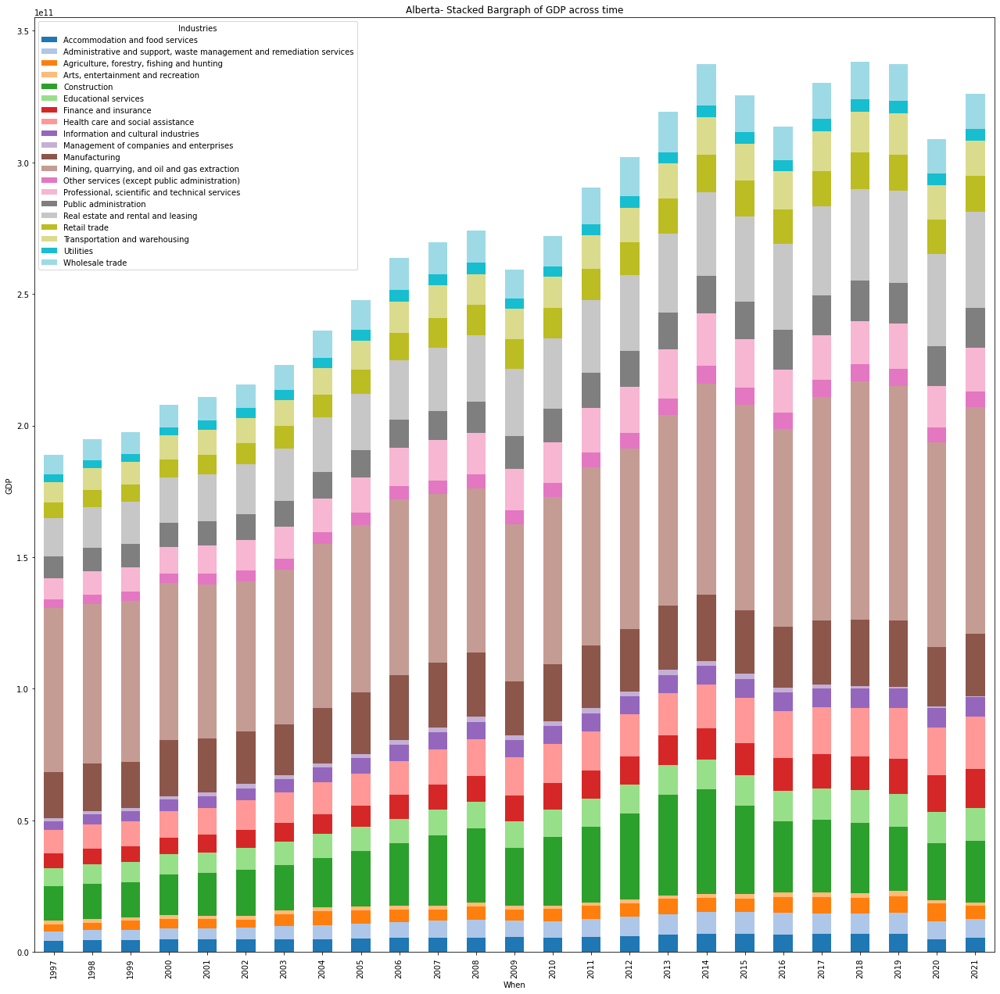

In [30]:
AB_Annual_GDP.dropna(thresh = 2,inplace=True)
OnlyAlberta = pd.DataFrame()
OnlyAlberta = AB_Annual_GDP[['When', 'Industries', 'Alberta']]
OnlyAlberta['When'] = pd.to_datetime(OnlyAlberta['When'], yearfirst= True)
OnlyAlberta['When'] = OnlyAlberta.When.dt.year
OnlyAlberta = OnlyAlberta[OnlyAlberta.Industries != 'All industries']
OnlyAlberta = OnlyAlberta[OnlyAlberta.Industries != 'Total gross domestic product']
OnlyAlberta = OnlyAlberta.set_index('When')

df = pd.pivot_table(OnlyAlberta, index='When', columns='Industries', values='Alberta')
df.dropna(inplace=True)


df.plot(kind = 'bar', stacked= True, figsize = (22,22),colormap = "tab20")
plt.ylabel("GDP")
plt.title("Alberta- Stacked Bargraph of GDP across time")
plt.show()

### Alberta Percentage of Industry contributions across year 

Since the starting point of our dataset: 1997, the mining industry dominate Alberta's economy. Across the years, till 2010, the percentage that the mining industry falls off since the other industries starts to grow. Post 2010, the mining industry goes back on an uptrend. 
If we look closely, the construction seems to peak at 2014 and stabilizes at around 6% of the GDP. 

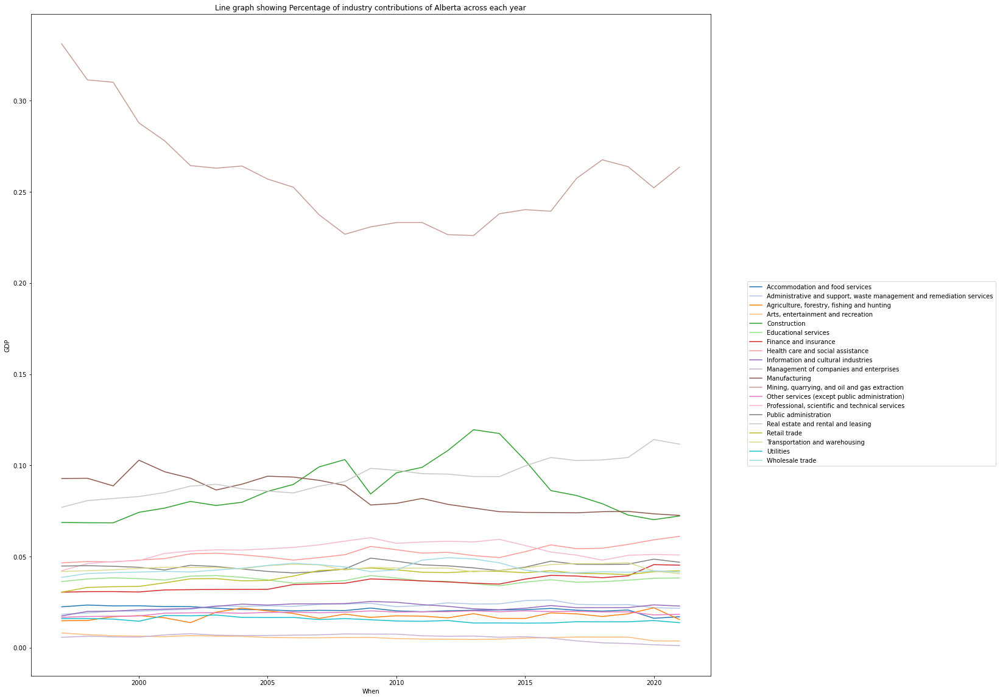

In [31]:
OnlyAlbertaB = OnlyAlberta.copy()
OnlyAlbertaB['Total_Sum'] = OnlyAlbertaB.groupby('When').sum()
OnlyAlbertaB['Percentage_of_Industry'] = OnlyAlbertaB['Alberta']/OnlyAlbertaB['Total_Sum']
AlbertaEE = pd.pivot_table(OnlyAlbertaB, index='When', columns='Industries', values='Percentage_of_Industry')
AlbertaEE.dropna(inplace=True)

AlbertaEE.plot(kind = 'line', stacked= False,figsize = (20,20),colormap = "tab20")
plt.ylabel("GDP")
plt.legend(bbox_to_anchor=(1.05, 0.6))
plt.title("Line graph showing Percentage of industry contributions of Alberta across each year")
plt.show()

### Interactive Barplot showing Alberta's industry contribution to GDP from 1997 to 2021

Plotted below is an interactive barplot that goes from 1997 to 2021. Move the slider to change the year that the graph corresponds to. 

In [32]:
#Data cleaning for Barplot Interactive barplot
BarAlberta = AlbertaEE.copy()
BarAlberta = BarAlberta.stack().reset_index()
BarAlberta = BarAlberta.rename({0:'Percent_of_GDP'},axis=1)
BarAlberta

,When,Industries,Percent_of_GDP
0,1997,Accommodation and food services,0.022414
1,1997,"Administrative and support, waste management a...",0.018383
2,1997,"Agriculture, forestry, fishing and hunting",0.014757
3,1997,"Arts, entertainment and recreation",0.008060
4,1997,Construction,0.068670
...,...,...,...
495,2021,Real estate and rental and leasing,0.111625
496,2021,Retail trade,0.042177
497,2021,Transportation and warehousing,0.040545
498,2021,Utilities,0.013703


In [33]:
colors = ['black', 'silver','gray','maroon','red','purple','fuchsia','green',
         'lime','olive','yellow','navy','blue','teal','aqua','brown','coral','cornflowerblue',
         'crimson','indigo']
x = list(BarAlberta.Industries.unique())
mydict = {}
for i in range(len(x)): 
    mydict[x[i]] = colors[i] #Making a dictionary for assigning colors 

fig = px.bar(
    BarAlberta,
    x="Industries",
    y="Percent_of_GDP",
    text="Industries",
    color="Industries",
    orientation="v",
    animation_frame="When",
    color_discrete_map = mydict
)

# a bit of formatting...

fig.update_layout(
    autosize=False,
    title='Interactive Barplot showing Alberta\'s industry contribution to GDP from 1997 to 2021',
    width=1000,
    height=600,
    
)

fig.update_xaxes(showticklabels=False) #Deleting the Xaxes labels as it disrupts the widget 

fig.show()

## Question 4: How has Alberta’s population changed over time compared to other provinces?

- Line plot of Alberta's population across time
- Line plot of each province's population across time 

### Line plot of Alberta's population across time

In [34]:
dfautolineplotter(dffiltering("Alberta Population"),"Alberta Population vs Time","Population")

### Line plot of each province's population across time 

In [35]:
dfautolineplotter(dffiltering("Population"),"Population Plot","Population")

## Question 5: How has Alberta’s GDP per capita changed over time?

- Violin plot of distributions of annual provincial GDP per capita 
- Line plot of Provincial GDP per capita time series

### Violin plot of distributions of annual provincial GDP per capita 

This violin plot displays the distribution of annual provincial GDP per capitas which is useful to compare the spread of GDPs per capita by province. Below is the visualization. 

In [36]:
anngrowcapfile = 'Data_601/Generated_GDP_percap_gr.csv'
anngrowcap = pd.read_csv(anngrowcapfile)
anngrowcap = anngrowcap[3:]
anngrowcap = anngrowcap.set_index('When')
provs = anngrowcap.columns
provslist = ['Alberta','Ontario','Quebec','Saskatchewan','British Columbia']
mydict={}
for i in range(len(provs)): 
    mydict[provs[i]] = provslist[i]
anngrowcap = anngrowcap.reset_index()
anngrowcap = anngrowcap.rename(mydict,axis=1)
anngrowcap.set_index('When',inplace = True)

In [37]:
data = [ 
    {"type" :'violin', 'y': anngrowcap[prov], 'box' : {'visible' : True}, 'meanline': {'visible' : True}, 'name' : prov} for prov in provslist
]

py.iplot(data)

### Line plot of Provincial GDP per capita time series
This line plot displays the provincial GDP per capitas as time series. Annotated are the time frames of economic crises. Below is the visualization.

In [38]:
case_spec = dffiltering("percap")
fig = px.line(case_spec, x="Year_Season", y=case_spec.columns,
              hover_data={"Year_Season": "|%Y"},
              title="GDP per capita Plot based on Time")

fig.add_annotation( # I learnt how to do this from Stack overflow and I modified it to fit my dataset 
x='2020Q1', y=0.0769, text=f'Covid Dip', yanchor='bottom', showarrow=True, arrowhead=1, arrowsize=1, arrowwidth=2
, arrowcolor="#636363", ax=-20, ay=-30, font=dict(size=20, color="green", family="Courier New, monospace"), align="left", bordercolor='green', borderwidth=2, bgcolor="#CFECEC", opacity=0.8)
fig.add_annotation(# I learnt how to do this from Stack overflow and I modified it to fit my dataset 
x='2008Q3'
, y=0.0769
, text=f'Economic Crash Dip'
, yanchor='bottom',font=dict(size=20, color="green", family="Courier New, monospace")
, showarrow=True, arrowhead=1,arrowsize=1,arrowwidth=2,arrowcolor="#636363",ax=-20
,ay=-30,align="left",bordercolor='green',borderwidth=2,bgcolor="#CFECEC",opacity=0.8)
fig.add_annotation( # I learnt how to do this from Stack overflow and I modified it to fit my dataset 
x='2015Q1'
, y=0.083, text=f'Oil Crash Dip', yanchor='bottom', showarrow=True
, arrowcolor="#636363", arrowhead=1, arrowsize=1, arrowwidth=2, font=dict(size=20, color="green", family="Courier New, monospace")
, ax=-20, ay=-30
, align="left", bordercolor='green', borderwidth=2, bgcolor="#CFECEC", opacity=0.8)
fig.add_vrect(x0="2014Q3", x1="2016Q2",  #Learnt this from Plotly library and modified it to make it work
              annotation_text="OilCrash", annotation_position="bottom right",  
              annotation_font_size=11,
              annotation_font_color="Green",
              fillcolor="yellow", opacity=0.27, line_width=0)

fig.add_vrect(x0="2008Q3", x1="2009Q2", #Learnt this from Plotly library and modified it to make it work
              annotation_text="Economic Crash", annotation_position="bottom right",  
              annotation_font_size=11,
              annotation_font_color="Green",
              fillcolor="Green", opacity=0.27, line_width=0)

fig.add_vrect(x0="2019Q4", x1="2020Q4", #Learnt this from Plotly library and modified it to make it work
              annotation_text="Covid", annotation_position="bottom right",  
              annotation_font_size=11,
              annotation_font_color="Green",
              fillcolor="Red", opacity=0.27, line_width=0)
fig.update_layout(
xaxis = dict(
    tickmode = 'linear',
    tick0 = 4,
    dtick = 4
))

fig.show()


## Question 6: How consumer purchasing power changed over time? (GDP per capita/CPI)

- Line plot of provicial purchasing power Time Series
The line plot depicts the purchasing power of provincial economies as a time series.

In [39]:
autolineplotter(filtering("Purchasing"), "Purchasing Power Time Series", "Purchasing Power")

# Conclusion

Over the time period of our study Alberta has consistently been the 3rd largest economy of the 5 selected provinces but has the largest GDP/capita. Alberta’s annual GDP is similar to that of Quebec and BC. Additionally, we found that each studied province had a similar trend in CPI but the cost of consumer goods in Alberta has risen faster than any other provinces.

We found that the natural resource extraction sector is the largest in Alberta followed by the real estate, rental and leasing sector and then construction. We found that oil and gas comprises about 30% of Alberta’s GDP.

Each province experienced gradual growth of GDP between the year 2000 and 2008, but the subprime mortgage crisis of 2008 hurt the GDP of every province. However Alberta’s GDP was impacted more than other provincial GDPs during the 2008 crisis. Alberta's GDP performed well compared to other provinces between 2010 and 2015, but the oil price crash of 2015 had a strong negative effect on Alberta that the other provinces did not experience. Additionally, we found that every province had a similar trend in CPI but the cost of consumer goods in Alberta has risen faster than any other provinces.

We found that Alberta has consistently ranked 4th in population out of the 5 provinces investigated and Alberta’s relative growth roughly matches the relative growth of British Columbia.

Alberta has consistently had the highest GDP per capita in Canada and Alberta’s GDP per capita is more strongly affected by economic downturns than other provinces. Each provincial GDP reaction to economic downturn can easily be seen in the GDP per Capita plot. We also found that Alberta has a wider distribution of GDP per capita than other provinces.

We have also investigated ‘purchasing power’ which is the ratio of GDP per capita to CPI. This reflects the purchasing power of an individual in the economy. We found that the value of purchasing power to be decreasing for each province. Alberta’s purchasing power has decreased more than any other province which may have implications for the lifestyle of Albertans.

We have shown that Alberta is the strongest economy in Canada on a per person basis, however we have also seen that the distribution of Alberta’s annual GDP/capita is more widely distributed than other provinces which may indicate that Alberta is more sensitive to economic events.

Some possible next steps of this study would be to investigate the effect of the economic downturns on specific sectors in the Albertan economy and to quantify the difference in the effect of the downturns on the provincial economies. The purchasing power metric we used in this study is not founded on solid economic theory,so we would also like to apply the appropriate economic theories to make the purchasing power a quantifiable indicator.

# Reference
- https://economicdashboard.alberta.ca/
- https://seaborn.pydata.org/
- https://data.opendatasoft.com/explore/dataset/georef-canada-province%40public/export/?disjunctive.prov_name_en
- https://plotly.com/python/sliders/
- https://plotly.com/python/figure-labels/
- https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.drop.html
- https://plotly.com/python/sunburst-charts/
- https://medium.com/nerd-for-tech/enriching-data-visualizations-with-annotations-in-plotly-using-python-6127ff6e0f80
- https://towardsdatascience.com/100-stacked-charts-in-python-6ca3e1962d2b
